In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import random
import timeit
import math

1. **grade-school multiplication**

In [30]:
def grade_school_multiply(num1: str, num2: str):
    product = [0] * (len(num1) + len(num2)) #contain n+m digits
    position = len(product)-1
    
    for n1 in num1[::-1]:
        tempPos = position
        for n2 in num2[::-1]:
            product[tempPos] += int(n1) * int(n2)
            product[tempPos-1] += product[tempPos]//2
            product[tempPos] %= 2
            tempPos -= 1
        position -= 1
    pointer = 0
    while pointer < len(product) - 1 and product[pointer] == 0:
        pointer += 1
    return ''.join(map(str, product[pointer:])) #number without starting 0

2. **Karatsuba multiplication**

In [31]:
def karatsuba_multiply(num1: int, num2: int):
    if len(str(num1)) == 1 or len(str(num2)) == 1:
        return num1 * num2
    else:
        n = max(len(str(num1)), len(str(num2)))
        n_half = n//2
        
        a = num1//(10**(n_half))
        b = num1%(10**(n_half))
        c = num2//(10**(n_half))
        d = num2%(10**(n_half))
        
        ac = karatsuba_multiply(a, c)
        bd = karatsuba_multiply(b, d)
        ad_bc = karatsuba_multiply(a + b, c + d) - ac - bd
        result = ac * 10**(2*n_half) + ad_bc * 10**(n_half) + bd
        return result

3. **Theoretical time complexities**

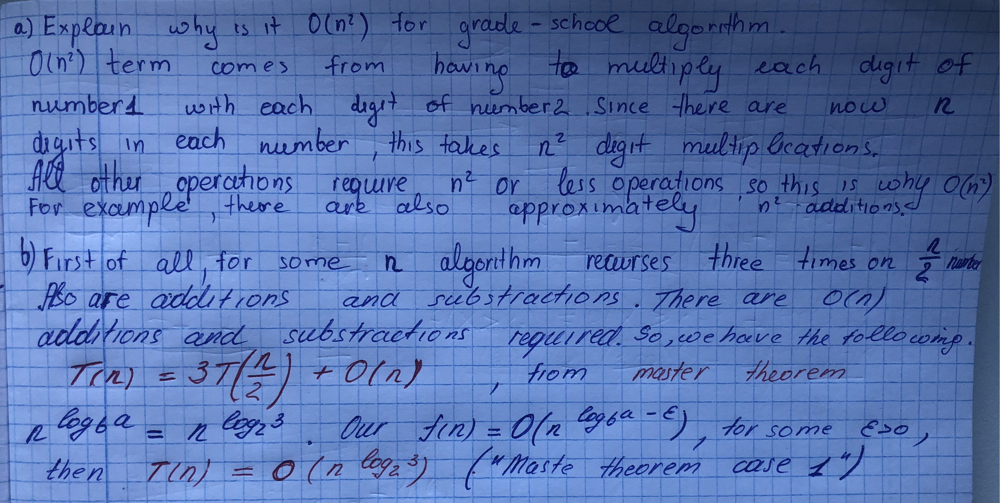

**Actual execution time in experiments**

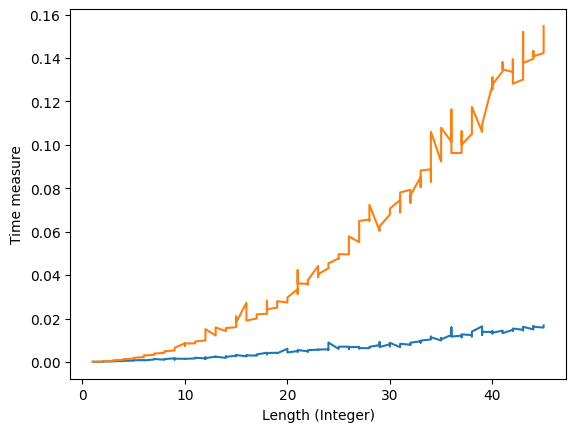

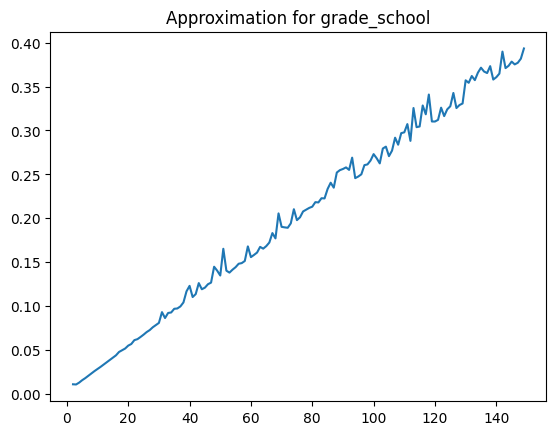

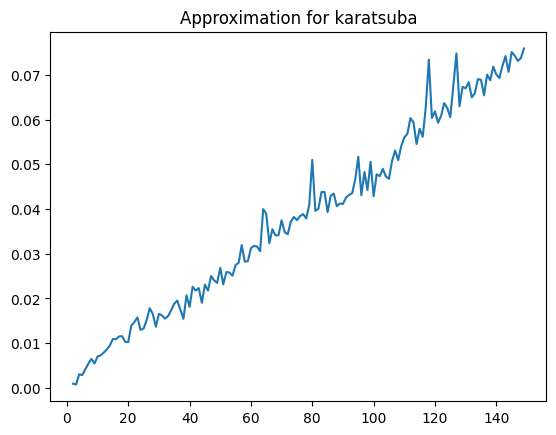

In [32]:
def grade_school(elements):
    result = []
    for i in elements:
        time = timeit.timeit(lambda: grade_school_multiply(bin(i)[2:], bin(i)[2:]), number=20)
        result.append(time)
    return result


def karatsuba(elements):
    result = []
    for i in elements:
        time = timeit.timeit(lambda: karatsuba_multiply(i, i), number=20)
        result.append(time)
    return result

element = [2**i - random.randint(2**i//10, 2*2**i//10) for i in range(2,150)]
karatsuba_t = karatsuba(element)
grade_school_t = grade_school(element)
plt.plot([len(str(x)) for x in element ], karatsuba_t)
plt.plot([len(str(x)) for x in element ], grade_school_t)
plt.ylabel('Time measure')
plt.xlabel('Length (Integer)')
plt.show()
grade_school_aprox = [i**(1/2) for i in grade_school_t]
plt.plot(list(range(2, 150)), grade_school_aprox)
plt.title('Approximation for grade_school')
plt.show()
karatsuba_aprox = [i**(math.log(2,3)) for i in karatsuba_t]
plt.plot(list(range(2, 150)), karatsuba_aprox)
plt.title('Approximation for karatsuba')
plt.show()
